In [98]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.metrics import structural_similarity as ssim

# **LAB AS-1(a)**

#### Utility Functions

In [2]:
def displayImages(img_arr,img_desc):
    #display image of all color spaces
    n = len(img_arr)
    row = n//4
    col = n if row==0 else 4
    fig, axs = plt.subplots(row+1,col,figsize=(32,8))
    for i in range(n):
        axs[i].imshow(img_arr[i],cmap=img_desc[i][1])
        axs[i].set_title(img_desc[i][0],fontsize=21)
        axs[i].set_xticks([])
        axs[i].set_yticks([])

In [3]:
def colorThresholding(img,lower_bounds,upper_bounds):
    mask = cv2.inRange(img, lower_bounds, upper_bounds)
    mask = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)
    frame= img & mask
    return frame    

## **TASK-1 Basic Image Statistics and Color Space Conversion**
### **Objective:** Compute basic statistics and convert an image into different color spaces

#### 1. Read the Image

In [4]:
#read the image
img1 = cv2.cvtColor(cv2.imread("images/img1.jpeg"), cv2.COLOR_BGR2RGB)

#### 2. Compute Basic Statistics

In [5]:
def computeStats(arr,channel):
    print(f"Mean of the {channel} channel:",np.mean(arr))
    print(f"Standard deviation of the {channel} channel:",np.std(arr))
    plt.hist(arr.reshape(-1,1),color=channel.lower())
    plt.xlabel('Pixel Values')
    plt.ylabel('Frequency')
    plt.title(f'Histogram for {channel} channel')
    plt.show()

Mean of the Blue channel: 185.58083333333335
Standard deviation of the Blue channel: 41.260314892398014


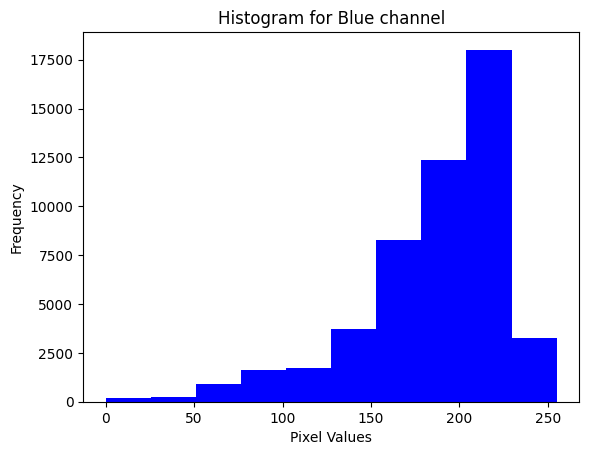

In [6]:
computeStats(img1[:,:,0],'Blue')

Mean of the Green channel: 108.67315476190477
Standard deviation of the Green channel: 41.15814613923842


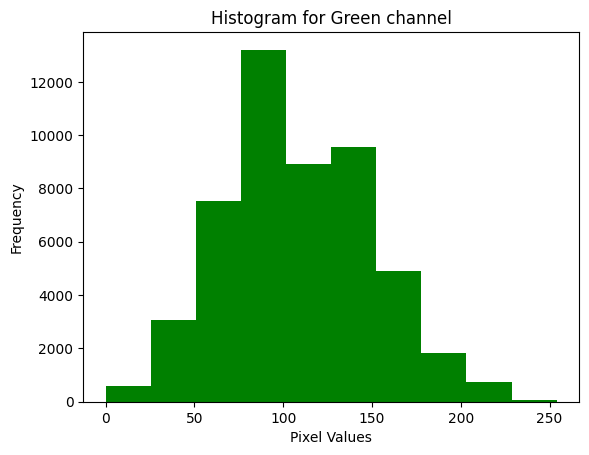

In [7]:
computeStats(img1[:,:,1],'Green')

Mean of the Red channel: 101.19654761904762
Standard deviation of the Red channel: 61.331417380673145


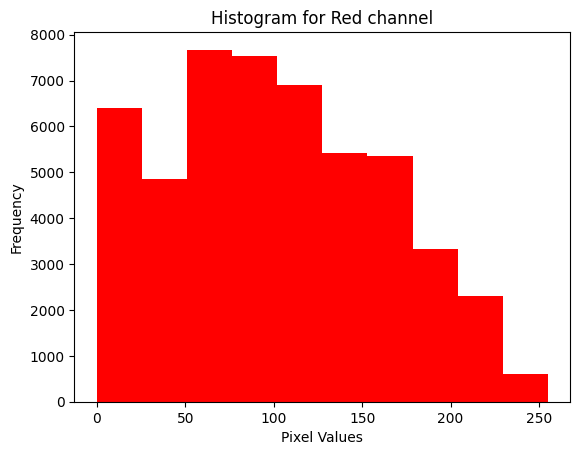

In [8]:
computeStats(img1[:,:,2],'Red')

#### 3. Convert Color Spaces

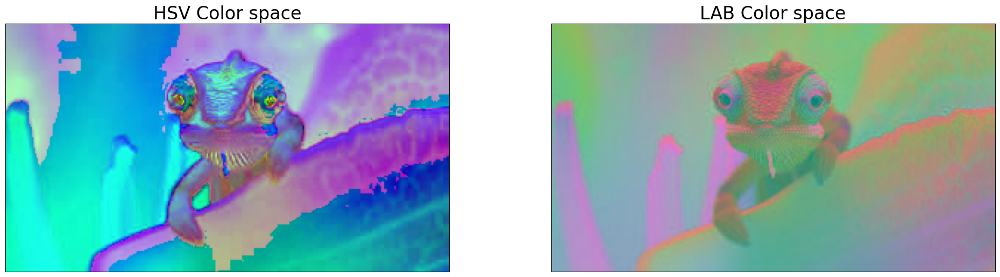

In [9]:
img1_hsv = cv2.cvtColor(img1, cv2.COLOR_RGB2HSV)
img1_lab = cv2.cvtColor(img1, cv2.COLOR_RGB2LAB)

fig, axs = plt.subplots(1,2,figsize=(24,6))
axs[0].imshow(img1_hsv)
axs[0].set_title("HSV Color space",fontsize=24)
axs[0].set_xticks([])
axs[0].set_yticks([])

axs[1].imshow(img1_lab)
axs[1].set_title("LAB Color space",fontsize=24)
axs[1].set_xticks([])
axs[1].set_yticks([])
plt.show()

## **TASK-2: Simple Image Segmentation using Thresholding**
### **Objective:** Segment an image into foreground and background using global thresholding

#### 1. Read the grayscale image

In [10]:
img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)

#### 2. Apply Thresholding

In [11]:
__,img1_threshold = cv2.threshold(img1_gray, 120, 255, cv2.THRESH_BINARY_INV)

#### 3. Display the results

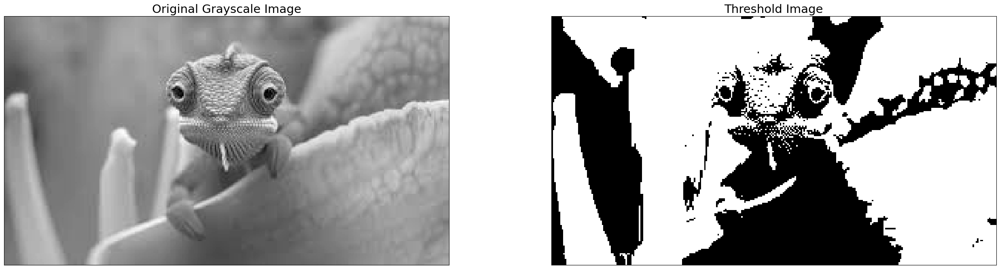

In [12]:
displayImages([img1_gray, img1_threshold],[["Original Grayscale Image", "gray"],["Threshold Image","binary"]])

## **TASK-3: Color-based Segmentation**
### **Objective:** Segment specific objects in an image based on their color

#### 1. Read the image

In [13]:
img1 = cv2.cvtColor(cv2.imread("images/img1.jpeg"), cv2.COLOR_BGR2RGB)

#### 2. Convert to HSV Color space

In [14]:
img1_hsv = cv2.cvtColor(img1, cv2.COLOR_RGB2HSV)

#### 3. Apply Color Thresholding

In [15]:
#order of blue, green and red
lower_bounds = (0,0,100)
upper_bounds = (185,185,225)
img1_thresh = colorThresholding(img1,lower_bounds,upper_bounds)

#### 4. Display results

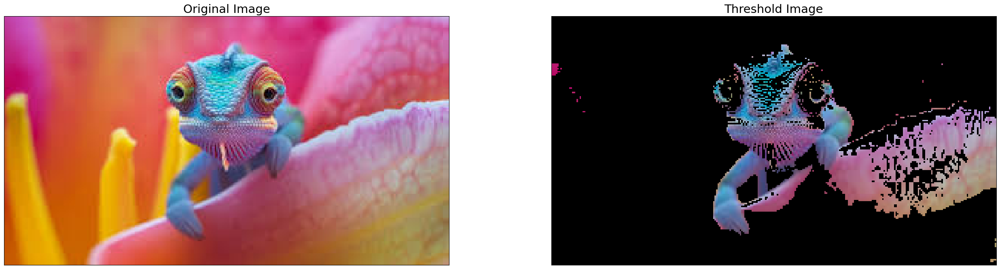

In [16]:
displayImages([img1,img1_thresh],[["Original Image",None],["Threshold Image",None]])

# **LAB AS-1(b)**

## **TASK-1 Image Negative Transformation**
### **Objective:** Create an image negative using Python

#### Utility Functions

In [17]:
def displayImages(img_arr,img_desc):
    #display image of all color spaces
    n = len(img_arr)
    row = n//5
    r_1 = row+1
    col = n if row==0 else 4
    fig, axs = plt.subplots(r_1,col,figsize=(16*r_1,4*r_1))
    count = 0
    if row==0:
        if col==1:
            axs.imshow(img_arr[0],cmap=img_desc[1])
            axs.set_title(img_desc[0],fontsize=20)
            axs.set_xticks([])
            axs.set_yticks([])
        else:
            for i in range(n):
                axs[i].imshow(img_arr[count],cmap=img_desc[count][1])
                axs[i].set_title(img_desc[count][0],fontsize=10*r_1)
                axs[i].set_xticks([])
                axs[i].set_yticks([])
                count+=1
    else:
        for j in range(row+1):
            for i in range(col):
                if count==n:
                    break
                axs[j][i].imshow(img_arr[count],cmap=img_desc[count][1])
                axs[j][i].set_title(img_desc[count][0],fontsize=10*r_1)
                count+=1
        for j in range(row+1):
            for i in range(col):
                axs[j][i].set_xticks([])
                axs[j][i].set_yticks([])

In [18]:
def loadPower(gamma, c, img1):
    return np.int32(c*(img1**gamma))

#### 1. Load a grayscale image

In [19]:
img1_grayscale = cv2.cvtColor(cv2.imread('images/img1.jpeg'),cv2.COLOR_BGR2GRAY)

#### 2. Apply the negative image transformation

In [20]:
n = 8
L = 2**n

In [21]:
img1_gray_neg = (L-1) - img1_grayscale

#### 3. Display the original and the negative image

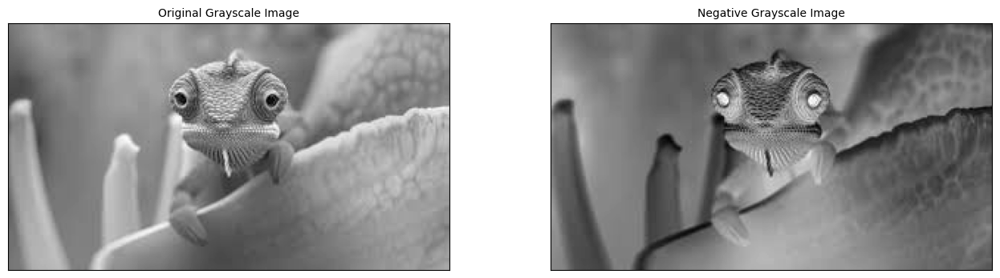

In [22]:
displayImages([img1_grayscale, img1_gray_neg],[["Original Grayscale Image", "gray"],["Negative Grayscale Image","gray"]])

## **TASK-2 Gamma Correction**
### **Objective:** Apply Gamma Correction with different gamma values

#### 1. Load a grayscale image

In [23]:
img1_grayscale = cv2.cvtColor(cv2.imread('images/img1.jpeg'),cv2.COLOR_BGR2GRAY)

#### 2. Apply Gamma Correction

gamma = 0.5

In [24]:
img1_gamma_1 = loadPower(0.5,1,img1_grayscale)

gamma = 1.0

In [25]:
img1_gamma_2 = loadPower(0.5,1,img1_grayscale)

gamma = 2.0

In [26]:
img1_gamma_3 = loadPower(0.5,2,img1_grayscale)

#### 3. Display the original and gamma corrected images

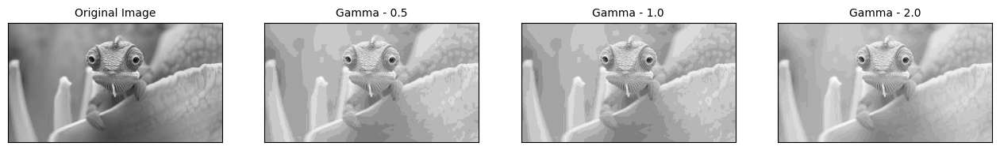

In [27]:
displayImages([img1_grayscale,img1_gamma_1,img1_gamma_2,img1_gamma_3],
              [["Original Image","gray"],["Gamma - 0.5","gray"],["Gamma - 1.0","gray"],["Gamma - 2.0","gray"]])

## **TASK-3 Log Transform**
### **Objective:** Apply log transformation to enhance an image

#### 1. Load a grayscale image

In [28]:
img1_grayscale = cv2.cvtColor(cv2.imread('images/img1.jpeg'),cv2.COLOR_BGR2GRAY)

#### 2. Apply log transformation

In [29]:
c = 1
img1_gray_log = np.int32(c*np.log(img1_grayscale+1))

#### 3. Display the original image alongside the transformed images for competition

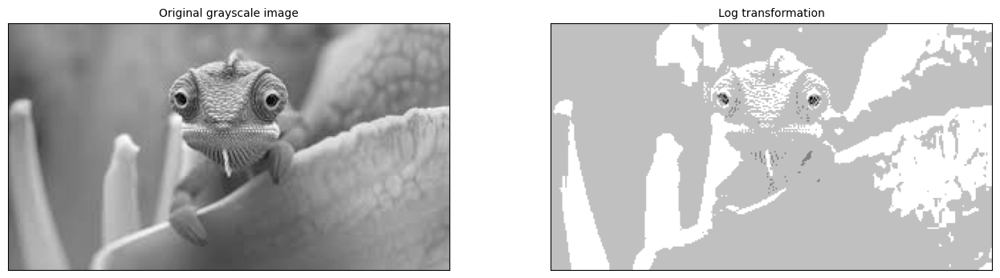

In [30]:
displayImages([img1_grayscale,img1_gray_log],[["Original grayscale image","gray"],["Log transformation","gray"]])

## **TASK-4 Compare Transformations**
### **Objective:** Compare the effects of different transformations

#### 1. Load a grayscale image

In [31]:
img1_grayscale = cv2.cvtColor(cv2.imread('images/img1.jpeg'),cv2.COLOR_BGR2GRAY)

#### 2. Apply image negative, gamma correction (gamma = 2.0) and log transformation

In [32]:
# image negative transformation
n = 8
L = 2**n
img1_gray_neg = (L-1) - img1_grayscale

In [33]:
# gamma correction
img1_gamma = loadPower(0.5,2,img1_grayscale)

In [34]:
# log transformation
c = 1
img1_gray_log = np.int32(c*np.log(img1_grayscale+1))

#### Display the original image alongside the transformed images for comparision

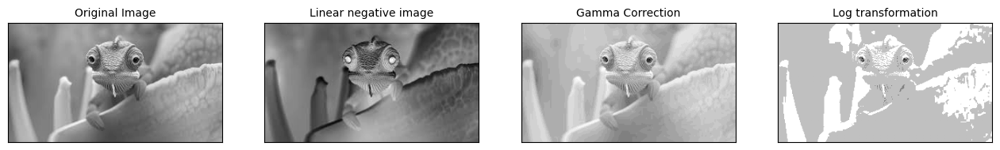

In [35]:
displayImages(
    [img1_grayscale,img1_gray_neg,img1_gamma,img1_gray_log],
    [["Original Image","gray"],["Linear negative image","gray"],["Gamma Correction","gray"],["Log transformation","gray"]])

## **TASK-5 Apply Transformations to Color Images**
### **Objective:** Apply the transformations to a color image by processing each channel separately

#### 1. Load a color image

In [36]:
img1_color = cv2.cvtColor(cv2.imread("images/img1.jpeg"), cv2.COLOR_BGR2RGB)

#### 2. Split the image into R, G and B channels

In [37]:
img1_shape = img1_color.shape

In [38]:
img1_R, img1_G, img1_B = img1_color.reshape(img1_shape[2],img1_shape[0],img1_shape[1])

#### 3. Apply image negative, gamma correction and log transformations to each channel

In [39]:
# image negative transformation
n = 8
L = 2**n
img1_R_neg = (L-1) - img1_R
img1_G_neg = (L-1) - img1_G
img1_B_neg = (L-1) - img1_B

In [40]:
# gamma correction
img1_gamma_R = loadPower(2,2,img1_R)
img1_gamma_G = loadPower(2,2,img1_G)
img1_gamma_B = loadPower(2,2,img1_B)

In [41]:
# log transformation
c = 10
img1_R_log = np.int32(c*np.log(np.int32(img1_R)+1))
img1_G_log = np.int32(c*np.log(np.int32(img1_G)+1))
img1_B_log = np.int32(c*np.log(np.int32(img1_B)+1))

#### 4. Merge the channels back together

In [42]:
img1_neg = np.asarray([img1_R_neg,img1_G_neg,img1_B_neg]).reshape(img1.shape)
img1_gamma = np.asarray([img1_gamma_R,img1_gamma_G,img1_gamma_B]).reshape(img1.shape)
img1_log = np.asarray([img1_R_log,img1_G_log,img1_B_log]).reshape(img1.shape)

#### 5. Display the original and the transformed images

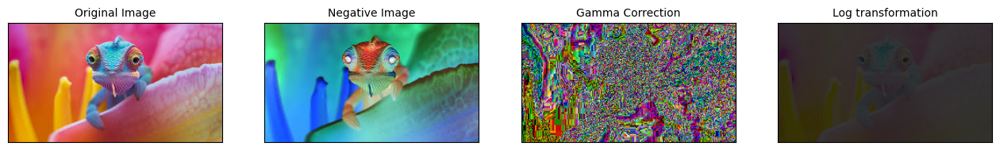

In [43]:
displayImages([img1_color,img1_neg,img1_gamma,img1_log],
              [["Original Image",None],["Negative Image",None],["Gamma Correction",None],["Log transformation",None]])

# **LAB AS-1(c)** (Image Enhancement - Histogram Equalization)

#### Utility Functions

In [44]:
def displayImages(img_arr,img_desc):
    #display image of all color spaces
    n = len(img_arr)
    row = n//5
    r_1 = row+1
    col = n if row==0 else 4
    fig, axs = plt.subplots(r_1,col,figsize=(16*r_1,4*r_1))
    count = 0
    if row==0:
        if col==1:
            axs.imshow(img_arr[0],cmap=img_desc[1])
            axs.set_title(img_desc[0],fontsize=20)
            axs.set_xticks([])
            axs.set_yticks([])
        else:
            for i in range(n):
                axs[i].imshow(img_arr[count],cmap=img_desc[count][1])
                axs[i].set_title(img_desc[count][0],fontsize=10*r_1)
                axs[i].set_xticks([])
                axs[i].set_yticks([])
                count+=1
    else:
        for j in range(row+1):
            for i in range(col):
                if count==n:
                    break
                axs[j][i].imshow(img_arr[count],cmap=img_desc[count][1])
                axs[j][i].set_title(img_desc[count][0],fontsize=10*r_1)
                count+=1
        for j in range(row+1):
            for i in range(col):
                axs[j][i].set_xticks([])
                axs[j][i].set_yticks([])

## **TASK-1 Introduction to Histogram Equalization**
### **Objective:** Understand the basics of histogram equalization and its impact on image contrast

#### 1. Load and display an image

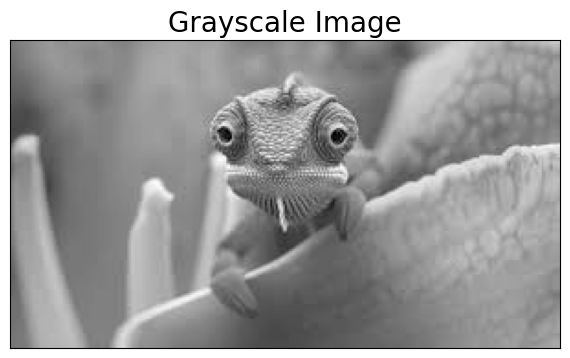

In [45]:
# load and display a grayscale image
img1_grayscale = cv2.cvtColor(cv2.imread('images/img1.jpeg'),cv2.COLOR_BGR2GRAY)
displayImages([img1_grayscale],['Grayscale Image','gray'])

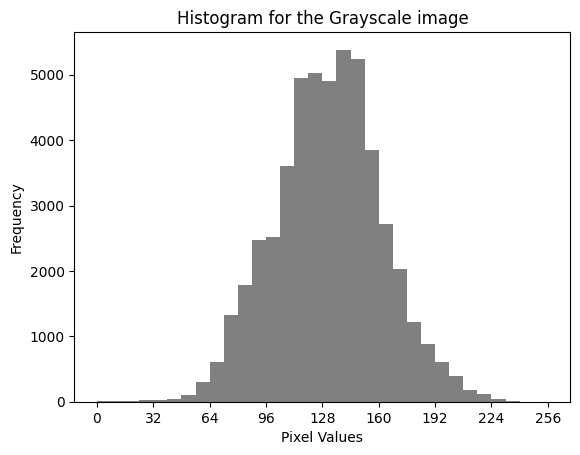

In [46]:
# histogram of the original image showing different pixel intensities
plt.hist(img1_grayscale.reshape(-1,1),color="gray",bins=32,range=[0,256])
plt.xlabel('Pixel Values')
plt.xticks(np.arange(0,257,32))
plt.ylabel('Frequency')
plt.title(f'Histogram for the Grayscale image')
plt.show()

#### 2. Calculate and plot histogram

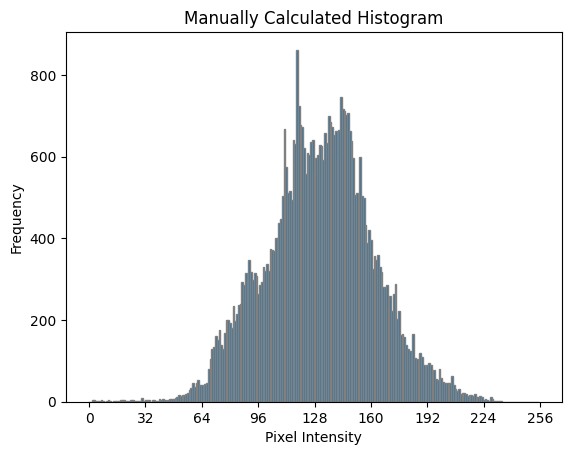

In [47]:
# calculating the histogram manually
bins = 256
histogram = np.zeros(bins)
for i in img1_grayscale.ravel():
    histogram[i] += 1
#plotting histogram to visualize pixel intensity distribution
plt.bar(range(bins), histogram, width=1, edgecolor='gray')
plt.title('Manually Calculated Histogram')
plt.xlabel('Pixel Intensity')
plt.xticks(np.arange(0,257,32))
plt.ylabel('Frequency')
plt.show()

#### 3. Calculate Cumulative Distribution Function (CDF)

In [48]:
# compute CDF from histogram
CDF = []
for i in range(bins):
    if i==0:
        CDF.append(histogram[0])
        continue
    CDF.append(CDF[i-1] + histogram[i])
CDF = np.asarray(CDF)

In [49]:
#normalizing the range of the CDF
CDF_norm = CDF*(bins-1)/CDF.max()

#### 4. Apply Histogram Equalization

In [50]:
# Map the original pixel values to equalized pixel values using the CDF
equalized_img = CDF_norm[img1_grayscale]

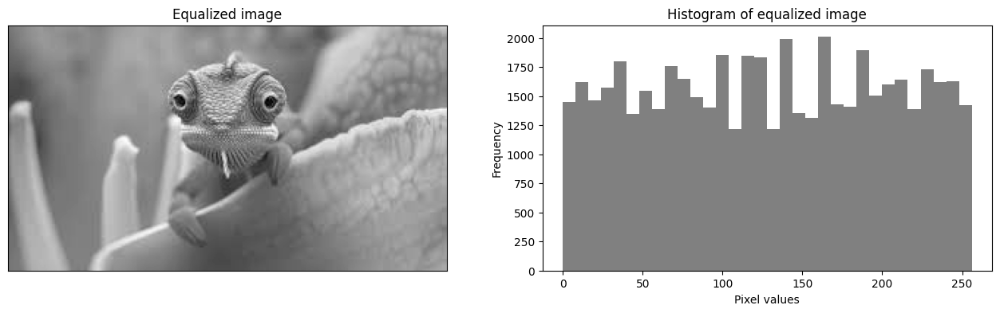

In [51]:
# display equalized image and its histogram
fig,axs = plt.subplots(1,2,figsize=(16,4))
axs[0].imshow(img1_grayscale,cmap="gray")
axs[0].set_title("Equalized image")
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[1].hist(equalized_img.ravel(),color="gray",bins=32,range=[0,256])
axs[1].set_title("Histogram of equalized image")
axs[1].set_xlabel("Pixel values")
axs[1].set_ylabel("Frequency")
plt.show()

#### 5. Compare results

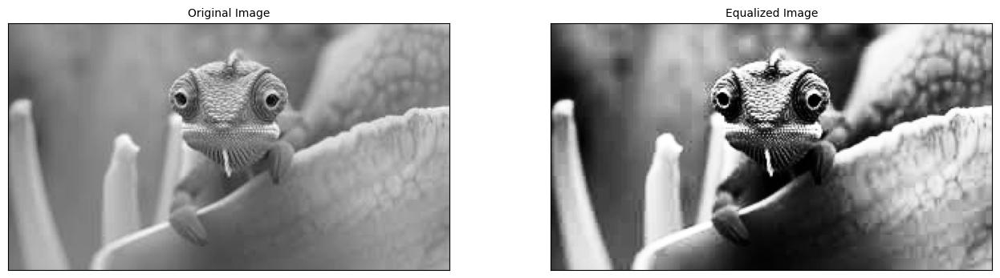

In [52]:
displayImages([img1_grayscale,equalized_img],[["Original Image","gray"],["Equalized Image","gray"]])

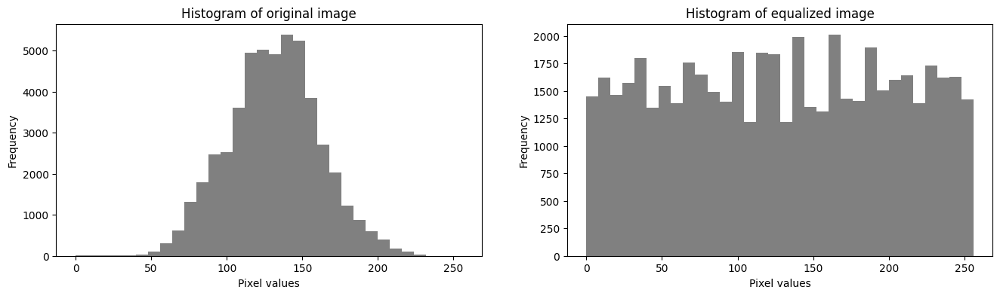

In [53]:
# comoparing the histogram distributions
fig,axs = plt.subplots(1,2,figsize=(16,4))
axs[0].hist(img1_grayscale.ravel(),color="gray",bins=32,range=[0,256])
axs[0].set_title("Histogram of original image")
axs[0].set_xlabel("Pixel values")
axs[0].set_ylabel("Frequency")
axs[1].hist(equalized_img.ravel(),color="gray",bins=32,range=[0,256])
axs[1].set_title("Histogram of equalized image")
axs[1].set_xlabel("Pixel values")
axs[1].set_ylabel("Frequency")
plt.show()

## **TASK-2 Comparing Histogram Equalization Techniques**
### **Objective:** Compare standard histogram equalization with adaptive histogram equalization

#### 1. Implement Adaptive Histogram Equalization (AHE)

In [54]:
def HistogramEqualisation(patch):
    bins = 256
    histogram = np.zeros(bins)
    for i in patch.ravel():
        histogram[i] += 1
    CDF = []
    for i in range(bins):
        if i==0:
            CDF.append(histogram[0])
            continue
        CDF.append(CDF[i-1] + histogram[i])
    CDF = np.asarray(CDF)
    CDF_norm = CDF*(bins-1)/CDF.max()
    return CDF_norm[patch]

In [55]:
def AHE(img,tile_size):
    s = img.shape
    AHE_img = np.zeros(s)
    for i in range(0,s[0],tile_size[0]):
        for j in range(0,s[1],tile_size[1]):
            patch = img[i:i+tile_size[0],j:j+tile_size[1]]
            AHE_img[i:i+tile_size[0],j:j+tile_size[1]] = HistogramEqualisation(patch)
    return AHE_img

In [56]:
AHE_img = AHE(img1_grayscale,(3,5))

#### 2. Implement Contrast Limited Adaptive Histogram Equalization (CLAHE)

In [57]:
def clahe_patch(patch,clip_val):
    bins = 256
    histogram = np.zeros(bins)
    for i in patch.ravel():
        histogram[i] += 1
    clip_val_threshold = clip_val*patch.size/256.0
    
    excess = np.maximum(histogram - clip_val_threshold, 0)
    hist = np.minimum(histogram, clip_val_threshold)

    excess_sum = excess.sum()
    histogram += excess_sum/256.0
    #calculating CDF of the histogram
    CDF = []
    for i in range(bins):
        if i==0:
            CDF.append(histogram[0])
            continue
        CDF.append(CDF[i-1] + histogram[i])
    CDF = np.asarray(CDF)
    cdf_normalized = CDF *(bins-1)/ CDF.max()
    cdf_normalized = cdf_normalized.astype('uint8')
    return cdf_normalized[patch]
    

In [58]:
def CLAHE(img,tile_size,CLIP_VAL=3.0):
    s = img.shape
    CLAHE_img = np.zeros(s)
    for i in range(0,s[0],tile_size[0]):
        for j in range(0,s[1],tile_size[1]):
            patch = img[i:i+tile_size[0],j:j+tile_size[1]]
            CLAHE_img[i:i+tile_size[0],j:j+tile_size[1]] = clahe_patch(patch,CLIP_VAL)
    return CLAHE_img

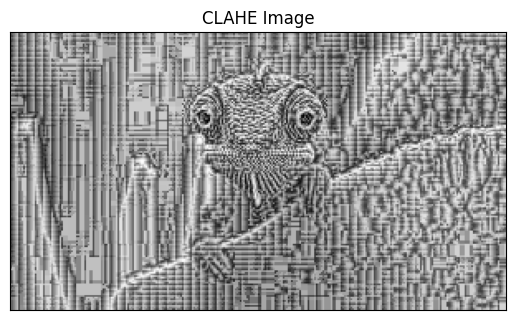

In [59]:
#display the result of CLAHE
clahe_img = CLAHE(img1_grayscale,(3,5),2.0)
plt.imshow(clahe_img,cmap='gray')
plt.title('CLAHE Image')
plt.xticks([])
plt.yticks([])
plt.show()

## **TASK-3 Implementing Histogram Equalization on Color Images**
### **Objective:** Apply histogram equalization to color images.

#### 1. Separate Color Channels

In [60]:
img_color = cv2.cvtColor(cv2.imread('images/img2.jpeg'),cv2.COLOR_BGR2RGB)
# Split the color image into its Red, Green, and Blue (RGB) channels. 
img_R = img_color[:,:,0]
img_G = img_color[:,:,1]
img_B = img_color[:,:,2]

#### 2. Apply Histogram Equalization to Each Channel

In [61]:
# Perform histogram equalization on each color channel separately. 
#Histogram equalization
img_R_he = HistogramEqualisation(img_R)
img_G_he = HistogramEqualisation(img_G)
img_B_he = HistogramEqualisation(img_B)

In [62]:
# Adaptive Histogram Evaluation
img_R_ahe = AHE(img_R,(3,5))
img_G_ahe = AHE(img_G,(3,5))
img_B_ahe = AHE(img_B,(3,5))

In [63]:
# Contrast Limited Adaptive Histogram Evaluation
img_R_clahe = CLAHE(img_R,(3,5),2.0)
img_G_clahe = CLAHE(img_G,(3,5),2.0)
img_B_clahe = CLAHE(img_B,(3,5),2.0)

#### 3. Reconstruct the Color Image

In [64]:
img_he = cv2.merge((img_R_he,img_G_he,img_B_he)).astype('uint8')
img_ahe = cv2.merge((img_R_ahe,img_G_ahe,img_B_ahe)).astype('uint8')
img_clahe = cv2.merge((img_R_clahe,img_G_clahe,img_B_clahe)).astype('uint8')

#### 4. Compare Results

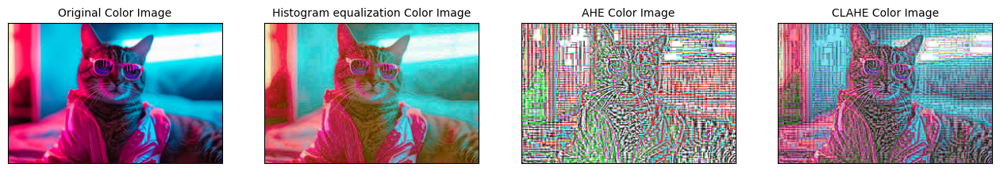

In [65]:
displayImages([img_color,img_he,img_ahe,img_clahe],
              [["Original Color Image",None],["Histogram equalization Color Image",None],
               ["AHE Color Image",None],["CLAHE Color Image",None]])

## **TASK-4 Histogram Equalization in Different Applications**
### **Objective:** Explore the use of histogram equalization in various applications.

#### Utility Functions

In [66]:
def HistogramEqualizationRGB(img,clip_val=2.0):
    img_R = img[:,:,0]
    img_G = img[:,:,1]
    img_B = img[:,:,2]
    # Histogram Equalization
    img_R_he = HistogramEqualisation(img_R)
    img_G_he = HistogramEqualisation(img_G)
    img_B_he = HistogramEqualisation(img_B)
    # Adaptive Histogram Evaluation
    img_R_ahe = AHE(img_R,(3,5))
    img_G_ahe = AHE(img_G,(3,5))
    img_B_ahe = AHE(img_B,(3,5))   
    # Contrast Limited Adaptive Histogram Evaluation
    img_R_clahe = CLAHE(img_R,(3,5),2.0)
    img_G_clahe = CLAHE(img_G,(3,5),2.0)
    img_B_clahe = CLAHE(img_B,(3,5),2.0)
    img_he = cv2.merge((img_R_he,img_G_he,img_B_he)).astype('uint8')
    img_ahe = cv2.merge((img_R_ahe,img_G_ahe,img_B_ahe)).astype('uint8')
    img_clahe = cv2.merge((img_R_clahe,img_G_clahe,img_B_clahe)).astype('uint8')
    displayImages([img,img_he,img_ahe,img_clahe],
              [["Original Color Image",None],["Histogram equalization Color Image",None],
               ["AHE Color Image",None],["CLAHE Color Image",None]])

#### 1. Medical Imaging

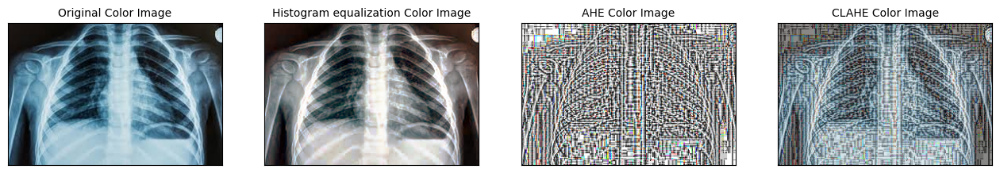

In [67]:
med_img = cv2.cvtColor(cv2.imread('images/img_medical.jpeg'),cv2.COLOR_BGR2RGB)
HistogramEqualizationRGB(med_img,clip_val=2.0)

#### 2. Satellite Imagery

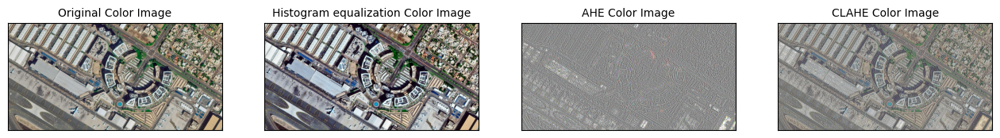

In [68]:
sat_img = cv2.cvtColor(cv2.imread('images/img_sat.jpg'),cv2.COLOR_BGR2RGB)
HistogramEqualizationRGB(sat_img,clip_val=2.0)

#### 3. Document Scanning

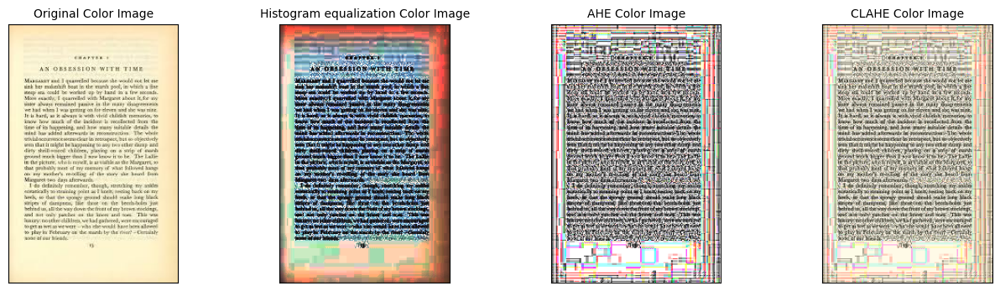

In [69]:
doc_img = cv2.cvtColor(cv2.imread('images/img_doc.jpeg'),cv2.COLOR_BGR2RGB)
HistogramEqualizationRGB(doc_img,clip_val=2.0)

#### 4. Night Vision

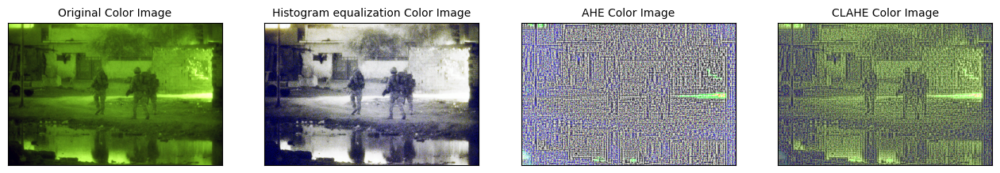

In [70]:
night_img = cv2.resize(cv2.cvtColor(cv2.imread('images/img_night.jpg'),cv2.COLOR_BGR2RGB),(450,300))
HistogramEqualizationRGB(night_img,clip_val=2.0)

## **TASK-5 Histogram Equalization for Low Contrast Images**
### **Objective:** Improve the visibility of features in images with low contrast.

#### 1. Select a low-contrast image

In [73]:
lowContrast_img = cv2.cvtColor(cv2.imread('images/img_lowContrast.jpg'),cv2.COLOR_BGR2RGB)

#### 2. Apply Histogram Evaluation

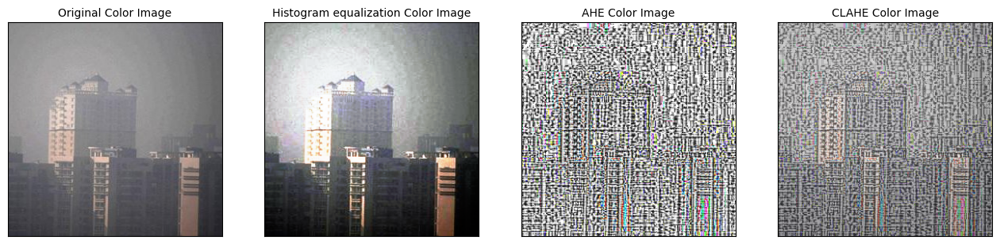

In [74]:
HistogramEqualizationRGB(lowContrast_img,clip_val=2.0)

## **TASK-6 Multi-Scale Histogram Equalization**
### **Objective:** Explore the effects of applying histogram equalization at different scales.

#### 1. Image Rescaling

In [82]:
img_100.shape

(500, 900, 3)

In [83]:
img_100 = cv2.cvtColor(cv2.imread('images/img_highRes.jpg'),cv2.COLOR_BGR2RGB)
img_50 = cv2.resize(img_100,(img_100.shape[1]//2,img_100.shape[0]//2))
img_200 = cv2.resize(img_100,(img_100.shape[1]*2,img_100.shape[0]*2))

#### 2. Apply Histogram Equalization

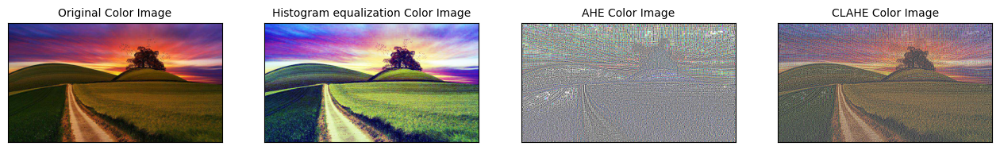

In [78]:
HistogramEqualizationRGB(img_100,clip_val=2.0)

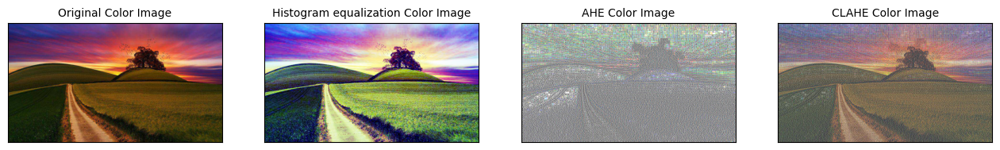

In [84]:
HistogramEqualizationRGB(img_200,clip_val=2.0)

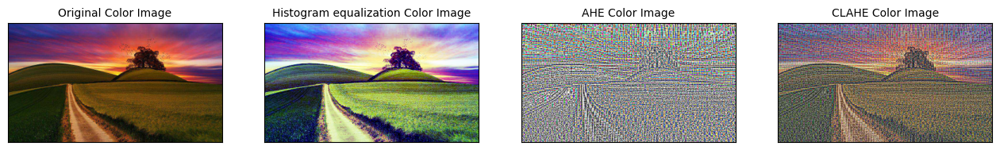

In [85]:
HistogramEqualizationRGB(img_50,clip_val=2.0)

## **TASK-7 Histogram Equalization for Image Enhancement**
### **Objective:** Use histogram equalization to enhance images for better visual analysis.

#### 1. Select Images

In [87]:
# image with varying level of detail and contrast
img_vary = cv2.cvtColor(cv2.imread('images/img_vary.jpg'),cv2.COLOR_BGR2RGB)

#### 2. Apply Histogram Equalization

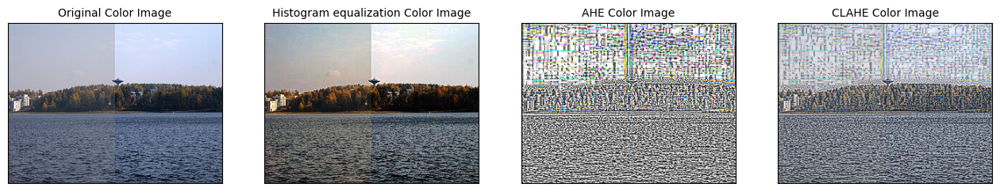

In [88]:
HistogramEqualizationRGB(img_vary,clip_val=2.0)

## **TASK-8 Histogram Equalization in Image Segmentation**
### **Objective:** Assess the impact of histogram equalization on image segmentation performance.

#### 1. Image Segmentation

In [90]:
# Perform segmentation on an image using thresholding or region-based methods. 
img1_gray = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
__,img1_threshold = cv2.threshold(img1_gray, 120, 255, cv2.THRESH_BINARY_INV)

#### 2. Apply Histogram Equalization

In [100]:
img1_gray_he = HistogramEqualisation(img1_gray).astype('uint8')

In [101]:
__,img1_threshold_he = cv2.threshold(img1_gray_he, 120, 255, cv2.THRESH_BINARY_INV)

#### 3. Compare Segmentation Results

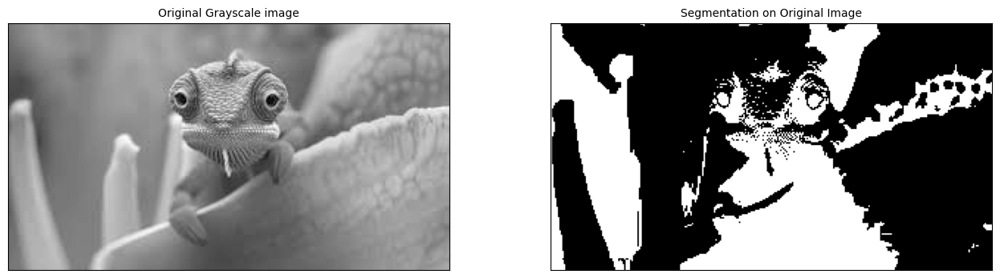

In [102]:
displayImages([img1_gray,img1_threshold],[["Original Grayscale image",'gray'],["Segmentation on Original Image",'gray']])

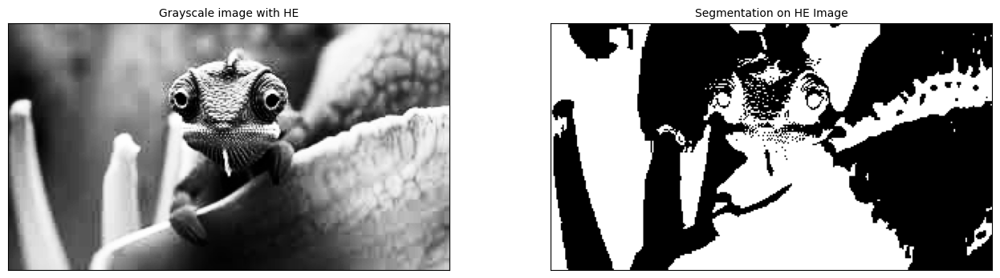

In [103]:
displayImages([img1_gray_he,img1_threshold_he],[["Grayscale image with HE",'gray'],["Segmentation on HE Image",'gray']])

#### Finding structural similarity

In [105]:
print(ssim(img1_threshold,img1_threshold_he))

0.7152575200192438
